# 🩺 Breast Cancer Wisconsin (Diagnostic) Dataset

## 📌 Overview
This dataset contains features computed from a digitized image of a **Fine Needle Aspirate (FNA)** of a breast mass. The goal is to classify the tumor as either **Malignant (M)** or **Benign (B)** based on cell nuclei characteristics.

## 📊 Data Structure
* **Instances:** 569 examples.
* **Features:** 30 numeric attributes + ID + Target.
* **Target:** `diagnosis` (Categorical: 'M' or 'B').
* **Missing Values:** None.

## 🧬 Feature Engineering
The 30 input features are derived from **10 base cell characteristics** (such as *Radius, Texture, Area, Smoothness, etc.*). For each characteristic, three measures are recorded:
1.  **Mean** (e.g., `radius_mean`)
2.  **Standard Error** (e.g., `radius_se`)
3.  **Worst** (mean of the 3 largest values, e.g., `radius_worst`)

In [ ]:
'''import kagglehub

# Download latest version
path = kagglehub.dataset_download("uciml/breast-cancer-wisconsin-data")

print("Path to dataset files:", path)'''

Using Colab cache for faster access to the 'breast-cancer-wisconsin-data' dataset.
Path to dataset files: /kaggle/input/breast-cancer-wisconsin-data


In [2]:
import pandas as pd
import os

'''files = os.listdir(path)
print("Files:", files)

csv_file = [f for f in files if f.endswith(".csv")][0]
csv_path = os.path.join(path, csv_file)'''


df = pd.read_csv('Breast Cancer Wisconsin.csv')

In [6]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [7]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Correlation Matrix

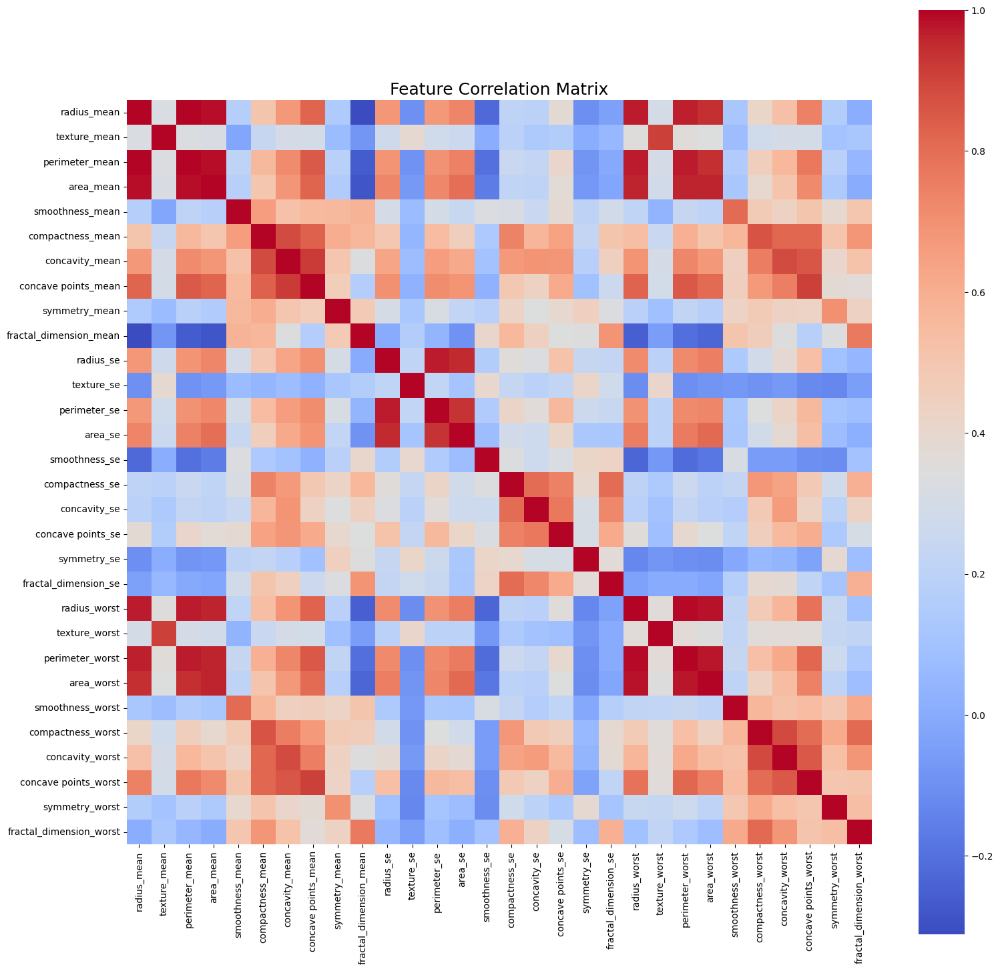

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

if "id" in df.columns:
    df = df.drop(columns=["id"])


df = df.loc[:, ~df.columns.str.contains("^Unnamed")]


target = df["diagnosis"]


features = df.drop(columns=["diagnosis"])


corr = features.corr()


plt.figure(figsize=(18, 18))
sns.heatmap(corr, cmap="coolwarm", annot=False, square=True)
plt.title("Feature Correlation Matrix", fontsize=18)
plt.show()


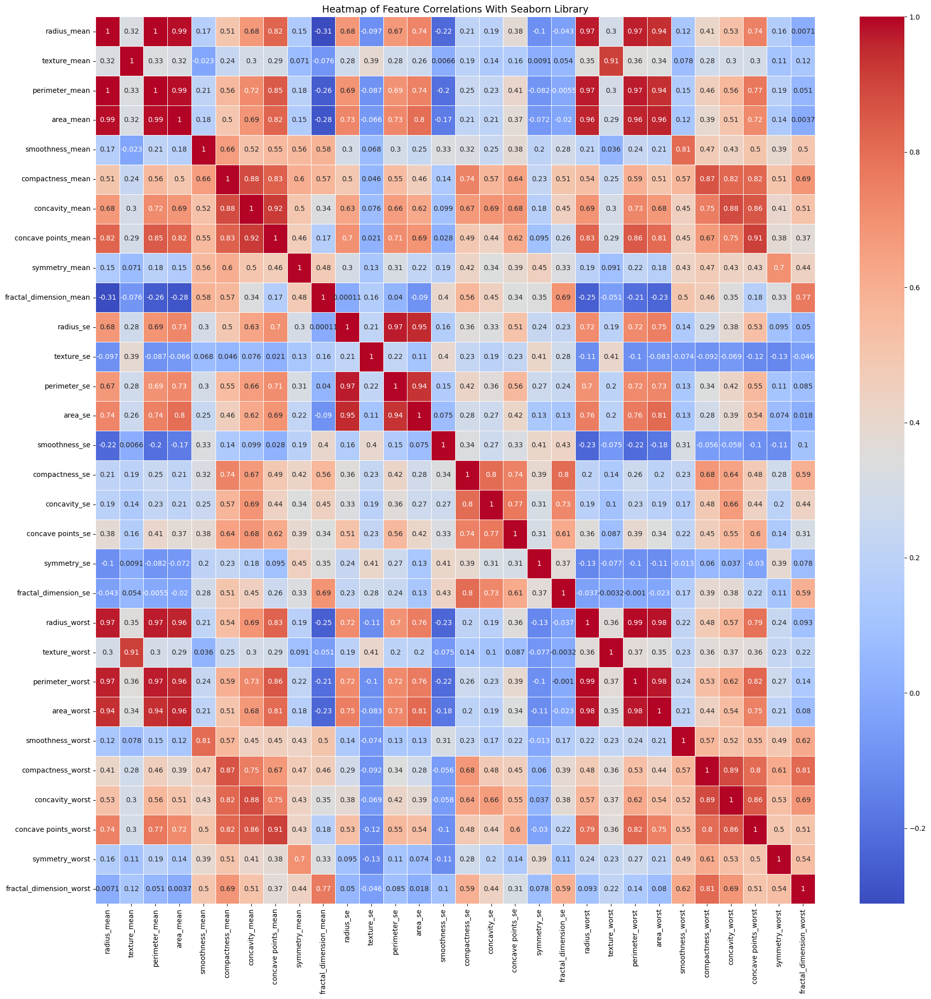

In [ ]:
numeric_df = df.select_dtypes(include=['int64', 'float64'])
corr_matrix = numeric_df.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Feature Correlations With Seaborn Library', fontsize=14)
plt.tight_layout()
plt.savefig('/content/HeatmapofFeatureCorrelationsWithSeabornLibrary.png', dpi=300, bbox_inches='tight')
plt.show()


Mean features: "Pairplot of 10 Mean Features"

<Figure size 1500x1500 with 0 Axes>

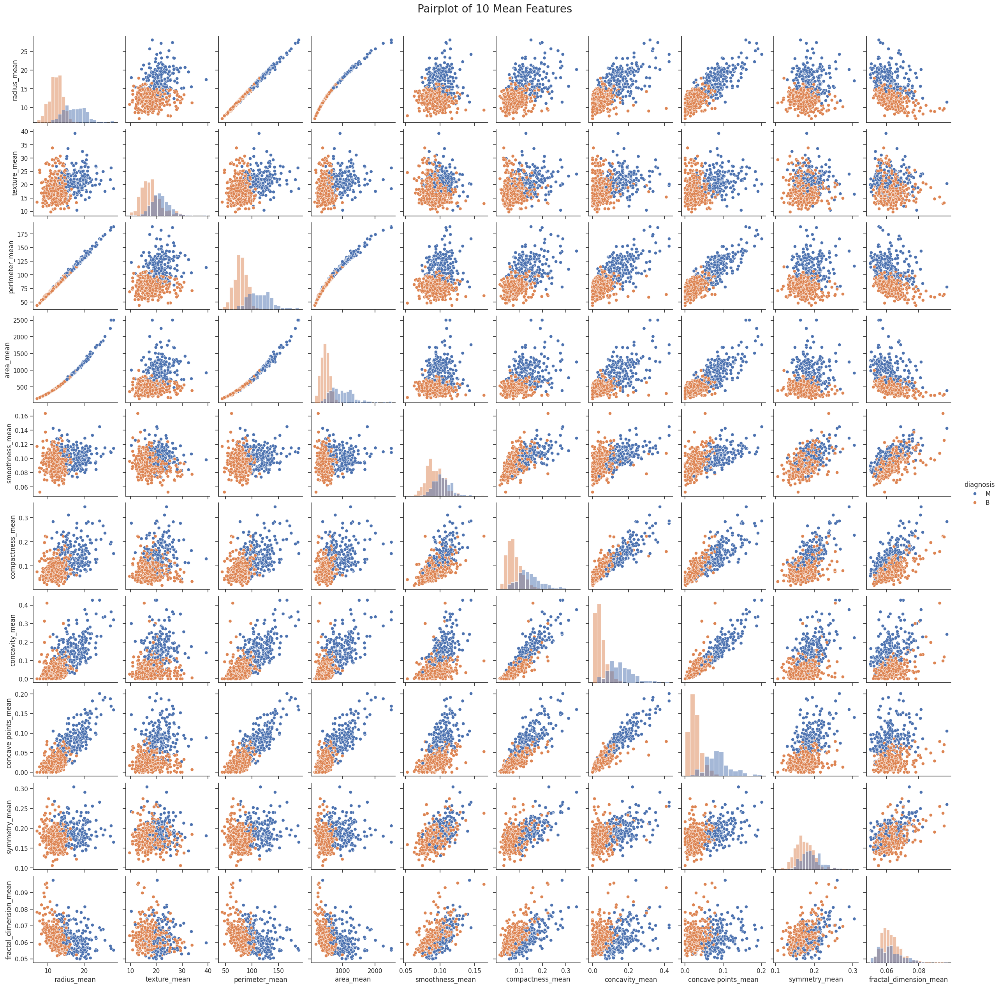

In [ ]:
mean_features = [
    'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean',
    'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'
]

pairplot_df = df[mean_features + ['diagnosis']]


sns.set(style="ticks")
plt.figure(figsize=(15, 15))
sns.pairplot(pairplot_df, hue='diagnosis', diag_kind='hist', corner=False)
plt.suptitle("Pairplot of 10 Mean Features", fontsize=20, y=1.02)
plt.show()

SE features: "Pairplot of 10 SE Features"

<Figure size 1500x1500 with 0 Axes>

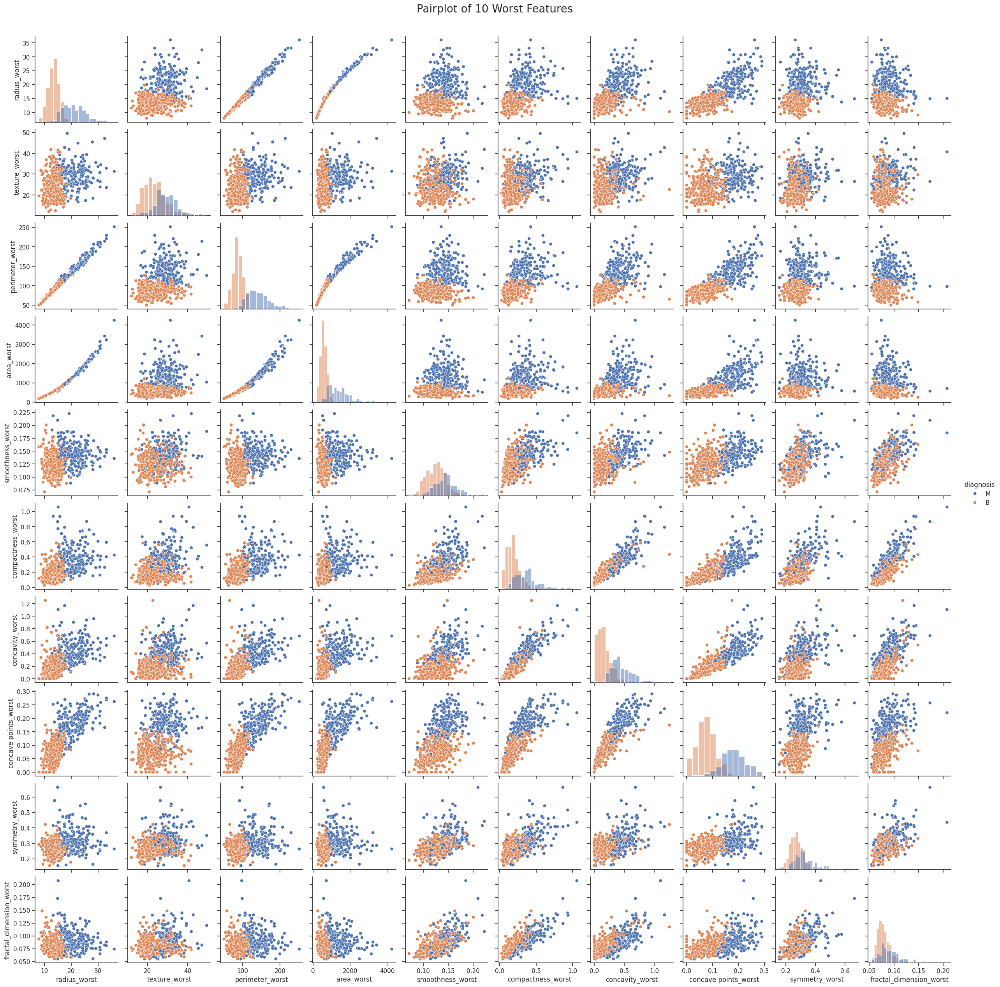

In [ ]:
worst_features = [
    'radius_worst',
    'texture_worst',
    'perimeter_worst',
    'area_worst',
    'smoothness_worst',
    'compactness_worst',
    'concavity_worst',
    'concave points_worst',
    'symmetry_worst',
    'fractal_dimension_worst'
]

pairplot_df = df[worst_features + ['diagnosis']]


sns.set(style="ticks")
plt.figure(figsize=(15, 15))
sns.pairplot(pairplot_df, hue='diagnosis', diag_kind='hist', corner=False)
plt.suptitle("Pairplot of 10 Worst Features", fontsize=20, y=1.02)
plt.show()

Worst features: "Pairplot of 10 Worst Features"

<Figure size 1500x1500 with 0 Axes>

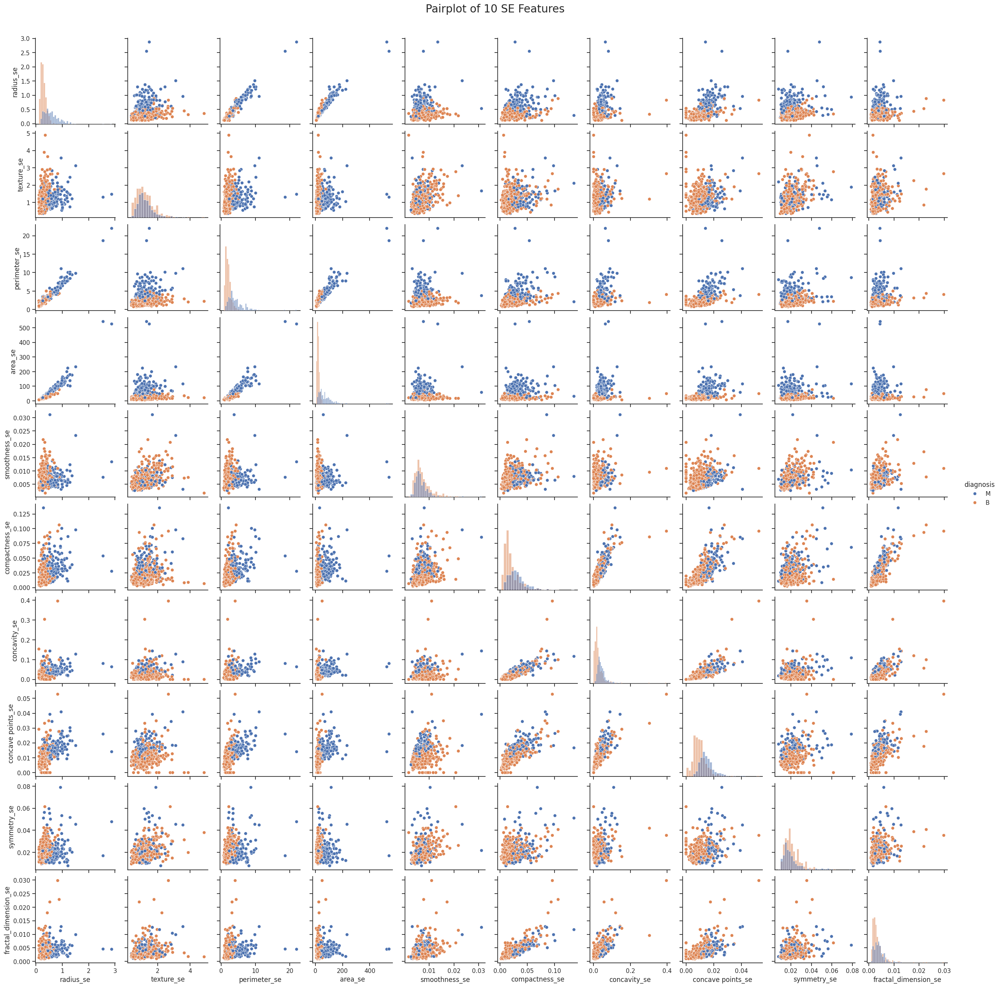

In [ ]:
se_features = [
    'radius_se',
    'texture_se',
    'perimeter_se',
    'area_se',
    'smoothness_se',
    'compactness_se',
    'concavity_se',
    'concave points_se',
    'symmetry_se',
    'fractal_dimension_se'
]
pairplot_df = df[se_features + ['diagnosis']]


sns.set(style="ticks")
plt.figure(figsize=(15, 15))
sns.pairplot(pairplot_df, hue='diagnosis', diag_kind='hist', corner=False)
plt.suptitle("Pairplot of 10 SE Features", fontsize=20, y=1.02)
plt.show()

Distribution of Diagnosis Classes

Number of samples per class:
diagnosis
B    357
M    212
Name: count, dtype: int64


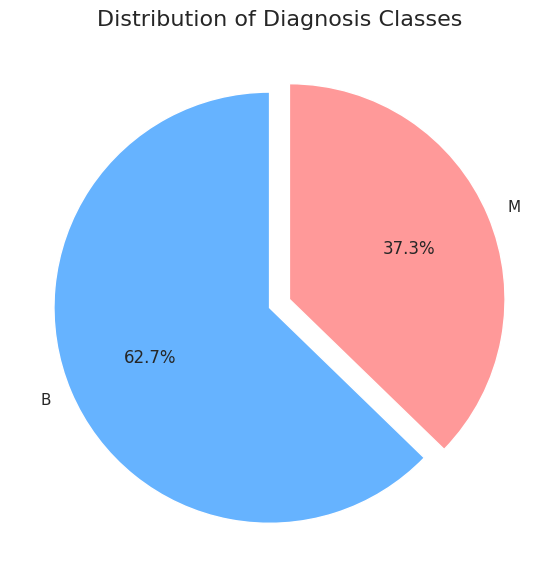

In [ ]:
class_counts = df['diagnosis'].value_counts()
print("Number of samples per class:")
print(class_counts)


plt.figure(figsize=(7, 7))
colors = ['#66b3ff','#ff9999']
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=90, colors=colors, explode=(0.05, 0.05))
plt.title("Distribution of Diagnosis Classes", fontsize=16)
plt.show()

Normalization

In [ ]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

X = features
y = target

le = LabelEncoder()
y_encoded = le.fit_transform(y)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

2D PCA of Breast Cancer Dataset

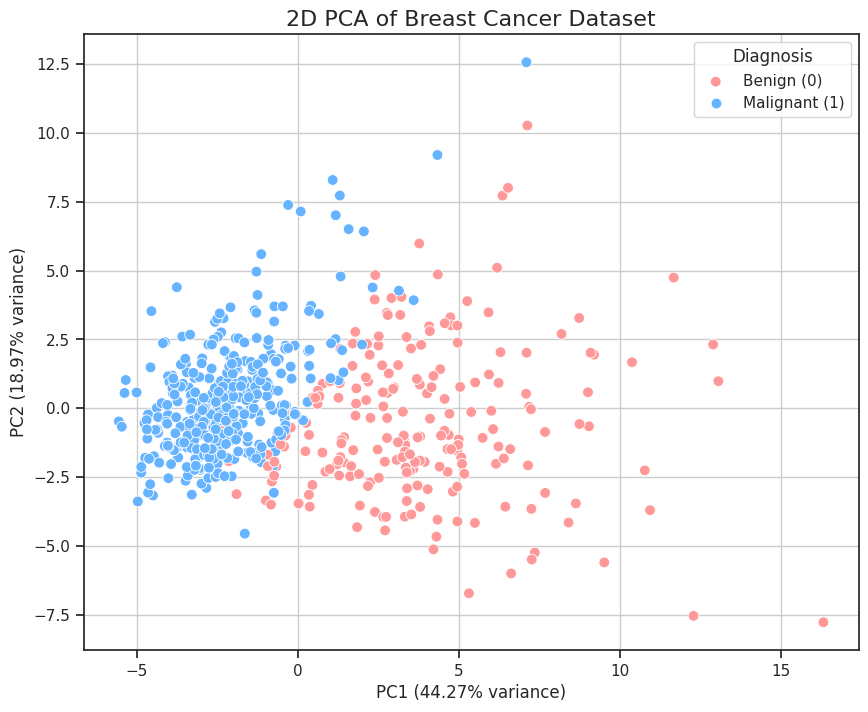

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)


pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['target'] = y_encoded

plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='target', palette=['#66b3ff', '#ff9999'], s=60)
plt.title('2D PCA of Breast Cancer Dataset', fontsize=16)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)')
plt.legend(title='Diagnosis', labels=['Benign (0)', 'Malignant (1)'])
plt.grid(True)
plt.show()

Train \ Validation \ Test Split

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_temp, y_train, y_temp = train_test_split(
    X_scaled, y_encoded, test_size=0.4, random_state=53, stratify=y_encoded
)


X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=53, stratify=y_temp
)


print("Train shape:", X_train.shape, y_train.shape)
print("Validation shape:", X_val.shape, y_val.shape)
print("Test shape:", X_test.shape, y_test.shape)

Train shape: (341, 30) (341,)
Validation shape: (114, 30) (114,)
Test shape: (114, 30) (114,)


Training model

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score


svc = SVC(kernel='linear', probability=True, random_state=53)
svc.fit(X_train, y_train)

SVC(kernel='linear', probability=True, random_state=53)

In [ ]:
import numpy as np
w = svc.coef_[0]



margin = 1 / np.linalg.norm(w)
print("Margin (1 / ||w||):", margin)

Margin (1 / ||w||): 0.33612753265333634


In [ ]:
y_val_pred = svc.predict(X_val)
y_test_pred = svc.predict(X_test)

# برای ROC-AUC نیاز به احتمال کلاس مثبت داریم
y_val_prob = svc.predict_proba(X_val)[:, 1]
y_test_prob = svc.predict_proba(X_test)[:, 1]

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score

def evaluate(y_true, y_pred, y_prob):
    report = classification_report(y_true, y_pred, output_dict=True)
    roc_auc = roc_auc_score(y_true, y_prob)

    return report, roc_auc

In [ ]:
report_val, roc_val = evaluate(y_val, y_val_pred, y_val_prob)
report_test, roc_test = evaluate(y_test, y_test_pred, y_test_prob)

print("Validation Classification Report:")
print(classification_report(y_val, y_val_pred))

print("Validation ROC-AUC:", roc_val)

print("\nTest Classification Report:")
print(classification_report(y_test, y_test_pred))

print("Test ROC-AUC:", roc_test)


Validation Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        72
           1       1.00      0.95      0.98        42

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114

Validation ROC-AUC: 0.9983465608465609

Test Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        71
           1       1.00      0.91      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.95      0.96       114
weighted avg       0.97      0.96      0.96       114

Test ROC-AUC: 0.987880773010154


Training model with different C

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score

def evaluate(y_true, y_pred, y_prob):
    report = classification_report(y_true, y_pred, output_dict=True)

    metrics = {
        "Accuracy": accuracy_score(y_true, y_pred),
        "Precision_macro": report["macro avg"]["precision"],
        "Recall_macro": report["macro avg"]["recall"],
        "F1_macro": report["macro avg"]["f1-score"],
        "ROC-AUC": roc_auc_score(y_true, y_prob)
    }
    return metrics

In [ ]:
C_values = [0.01, 0.1, 1, 10, 100]

results = []

In [ ]:
for C in C_values:
    svc = SVC(kernel='linear', C=C, probability=True, random_state=53)
    svc.fit(X_train, y_train)

    w = svc.coef_[0]
    margin = 1 / np.linalg.norm(w)

    y_val_pred = svc.predict(X_val)
    y_test_pred = svc.predict(X_test)

    y_val_prob = svc.predict_proba(X_val)[:, 1]
    y_test_prob = svc.predict_proba(X_test)[:, 1]

    val_metrics = evaluate(y_val, y_val_pred, y_val_prob)
    test_metrics = evaluate(y_test, y_test_pred, y_test_prob)

    sv_count = svc.n_support_.sum()

    results.append({
        "C": C,
        "Margin (1/||w||)": margin,

        "Val Accuracy": val_metrics["Accuracy"],
        "Val Precision": val_metrics["Precision_macro"],
        "Val Recall": val_metrics["Recall_macro"],
        "Val F1": val_metrics["F1_macro"],
        "Val ROC-AUC": val_metrics["ROC-AUC"],

        "Test Accuracy": test_metrics["Accuracy"],
        "Test Precision": test_metrics["Precision_macro"],
        "Test Recall": test_metrics["Recall_macro"],
        "Test F1": test_metrics["F1_macro"],
        "Test ROC-AUC": test_metrics["ROC-AUC"],

        "Support Vectors": sv_count
    })

In [ ]:
df_results = pd.DataFrame(results)
df_results

,C,Margin (1/||w||),Val Accuracy,Val Precision,Val Recall,Val F1,Val ROC-AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test ROC-AUC,Support Vectors
0,0.0100,1.5067,0.9825,0.9865,0.9762,0.9810,0.9983,0.9649,0.9733,0.9535,0.9619,0.9879,89
1,0.1000,0.6668,0.9912,0.9932,0.9881,0.9905,0.9980,0.9649,0.9673,0.9581,0.9623,0.9879,44
2,1.0000,0.3361,0.9737,0.9741,0.9692,0.9716,0.9960,0.9649,0.9673,0.9581,0.9623,0.9807,24
3,10.0000,0.1428,0.9561,0.9605,0.9454,0.9521,0.9940,0.9649,0.9627,0.9627,0.9627,0.9872,16
4,100.0000,0.1006,0.9561,0.9551,0.9504,0.9526,0.9940,0.9561,0.9516,0.9556,0.9535,0.9866,18


For C=0.1 Train model & Plot ROC \ Precision-Recall

In [55]:
best_C = 0.1

In [56]:
svc_best = SVC(kernel='linear', C=best_C, probability=True, random_state=53)
svc_best.fit(X_train, y_train)

SVC(C=0.1, kernel='linear', probability=True, random_state=53)

In [58]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
fpr, tpr, thresholds_roc = roc_curve(y_test, y_test_prob)
roc_auc = auc(fpr, tpr)


precision, recall, thresholds_pr = precision_recall_curve(y_test, y_test_prob)
avg_precision = average_precision_score(y_test, y_test_prob)

ROC & Precision-Recall On Test set

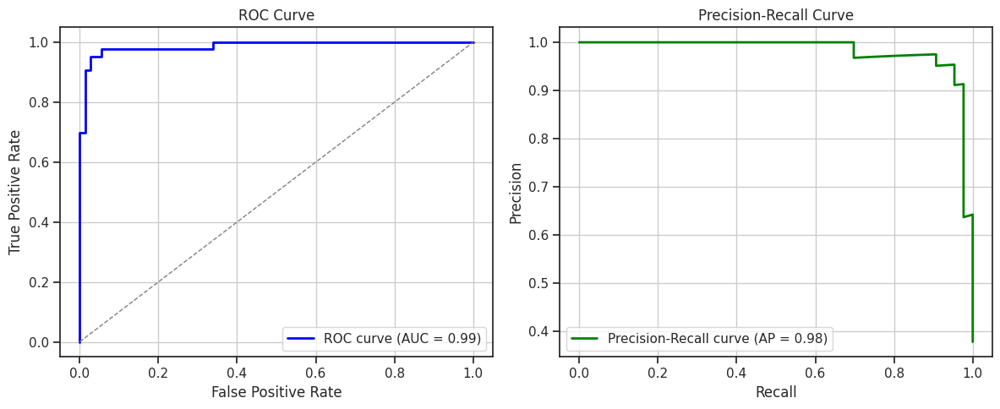

In [60]:
plt.figure(figsize=(12,5))

plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.grid(True)
plt.legend(loc="lower right")


plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='green', lw=2, label=f'Precision-Recall curve (AP = {avg_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.grid(True)
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()
